<a name='0'></a>

# Semantic Segmentation with DeepLabV3+ and PointRend

In the previous notebook, we learned about image segmentaion tasks. In this notebook, we will perform semantic segmentation in practice. Recall that semantic segmentation classifies each pixel with a semantic label.

For simplicity and the purpose of this notebook, we will perform inference using [DeepLabv3+](https://arxiv.org/abs/1802.02611) and [PointRend](https://arxiv.org/abs/1912.08193) with [Detectron2](https://github.com/facebookresearch/detectron2). If you want to do custom semantic segmentation, you can check out this([with Detectron2](https://github.com/facebookresearch/detectron2/tree/main/projects/DeepLab)) or this(with [TensorFlow DeepLab2](https://github.com/google-research/deeplab2/blob/main/g3doc/setup/your_own_dataset.md)).


***Outline***:

* [1. Set Up ](#1)
- [2. Getting Images](#2)
- [3. Performing Inference with DeepLabV3+](#3)
- [4. Final Notes](#4)
- [5. References and Further Learning](#5)

<a name='1'></a>

## 1. Set Up

Before we begin performing semantic segmentation with DeepLabV3+, let's install Detectron2 and other required dependencies.

In [1]:
!pip install pyyaml==5.1
import torch, torchvision
print(f"Torch + Cuda version: {torch.__version__}")

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 274 kB 5.2 MB/s 
  Created wheel for pyyaml: filename=PyYAML-5.1-cp37-cp37m-linux_x86_64.whl size=44092 sha256=f627d068d017d74533ad5373d17b5a4ad3e941c5c92b2e7a6f096548e2e6bdf1
  Stored in directory: /root/.cache/pip/wheels/77/f5/10/d00a2bd30928b972790053b5de0c703ca87324f3fead0f2fd9
Successfully built pyyaml
  Attempting uninstall: pyyaml
    Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13
Torch + Cuda version: 1.11.0+cu113


Let's [clone](https://git-scm.com/docs/git-clone) the Detectron2 source repository and install it from the source. 

In [2]:
!git clone https://github.com/facebookresearch/detectron2.git
!pip install -e detectron2 #install detectron2 from cloned repo(flag -e is for specifying path detectron2)

Cloning into 'detectron2'...
remote: Enumerating objects: 14178, done.
remote: Counting objects: 100% (79/79), done.
remote: Compressing objects: 100% (59/59), done.
remote: Total 14178 (delta 24), reused 58 (delta 18), pack-reused 14099
Receiving objects: 100% (14178/14178), 5.87 MiB | 20.79 MiB/s, done.
Resolving deltas: 100% (10226/10226), done.
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Obtaining file:///content/detectron2
     |████████████████████████████████| 50 kB 3.1 MB/s 
     |████████████████████████████████| 79 kB 7.4 MB/s 
     |████████████████████████████████| 151 kB 48.5 MB/s 
     |████████████████████████████████| 1.4 MB 66.3 MB/s 
     |████████████████████████████████| 843 kB 57.3 MB/s 
     |████████████████████████████████| 96 kB 8.3 MB/s 
     |████████████████████████████████| 117 kB 70.0 MB/s 
  Created wheel for fvcore: filename=fvcore-0.1.5.post20220512-py3-none-any.whl size=61288 sha256=19e3c96be058a53

After we have successfully installed Detectron2, it's best to restart the runtime for the installation to be effective.

After that, we will import all functions that we will need and other basic Python libraries.

In [1]:
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

from detectron2 import model_zoo
from detectron2.data import MetadataCatalog
from detectron2.config import get_cfg
from detectron2.engine import DefaultPredictor
from detectron2.utils.visualizer import Visualizer, ColorMode

# import DeepLab from detectron2/projects directory
from detectron2.projects import deeplab, point_rend

#import basic tools
import numpy as np
import cv2
import torch
from google.colab.patches import cv2_imshow #!!cv2.imshow crashes in colab

<a name='2'></a>

## 2. Getting the Images

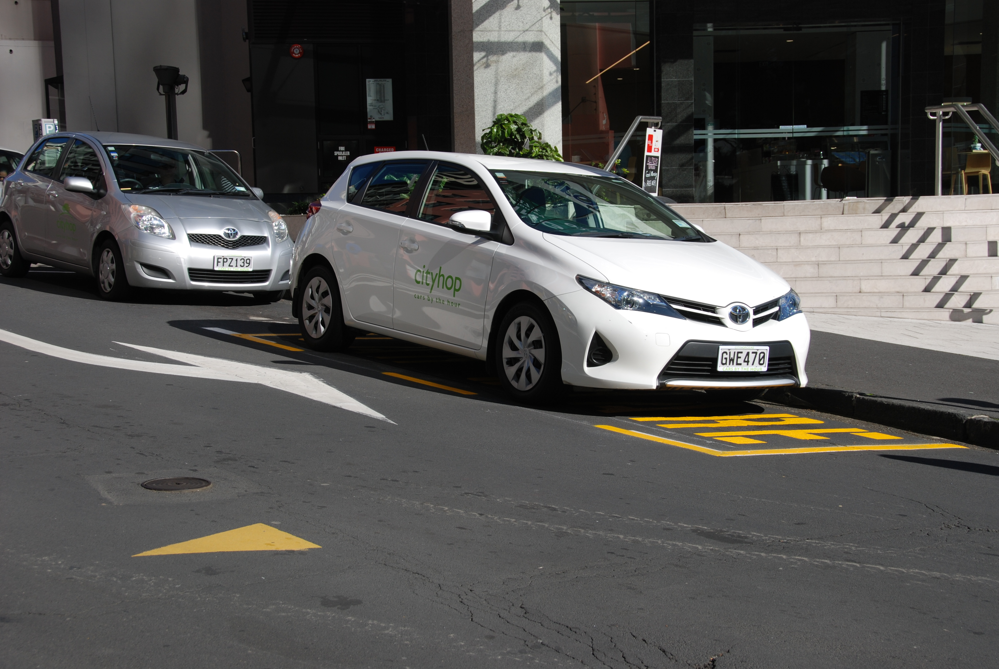

In [2]:
!wget https://upload.wikimedia.org/wikipedia/commons/a/ae/Cityhop_carshare.jpg -q -O image_1.jpg
image_1 = cv2.imread("./image_1.jpg")
cv2_imshow(image_1)

In [6]:
# !wget https://upload.wikimedia.org/wikipedia/commons/d/d8/Zurich_city_view.jpg -q -O image_2.jpg
# image_2 = cv2.imread("./image_2.jpg")
# cv2_imshow(image_2)

In [5]:
# !wget https://upload.wikimedia.org/wikipedia/commons/3/3c/San_Francisco_streetcar_737_%28ex-Brussels_7037%29_in_Zurich_paint_scheme_in_2014.jpg -q -O image_3.jpg
# image_3 = cv2.imread("./image_3.jpg")
# cv2_imshow(image_3)

<a name='3'></a>

## 3. Getting a Pretrained DeepLabV3+ and PointRend and Performing Inference

Performing inference on image is very straightforward and it happens to be very easy to get and use pretrained models from Detectron2.

So, we are going to create a [Detectron2 config](https://detectron2.readthedocs.io/en/latest/modules/config.html), get a [Pretrained DeepLabV3+](https://github.com/facebookresearch/detectron2/blob/main/projects/DeepLab/configs/Cityscapes-SemanticSegmentation/deeplab_v3_plus_R_103_os16_mg124_poly_90k_bs16.yaml), create a [DefaultPredictor](https://detectron2.readthedocs.io/en/latest/modules/engine.html#detectron2.engine.defaults.DefaultPredictor) and finally run it model on the image. We will also do the same thing for PointRend.

In [5]:
cfg = get_cfg()
deeplab.add_deeplab_config(cfg)
cfg.merge_from_file("detectron2/projects/DeepLab/configs/Cityscapes-SemanticSegmentation/deeplab_v3_plus_R_103_os16_mg124_poly_90k_bs16.yaml")
#cfg.INPUT.CROP.SIZE = (64, 128)
cfg.INPUT.CROP.ENABLED = False
cfg.MODEL.WEIGHTS = "detectron2://DeepLab/Cityscapes-SemanticSegmentation/deeplab_v3_plus_R_103_os16_mg124_poly_90k_bs16/28054032/model_final_a8a355.pkl"
deeplab_predictor = DefaultPredictor(cfg)

The checkpoint state_dict contains keys that are not used by the model:
  pixel_mean
  pixel_std


In creating DeepLab config, we don't crop the input image for compute reason. If your session crashes down, either crop the input image to something like (54,128) or don't crop the image as we did. This was discussed [here](https://github.com/facebookresearch/detectron2/issues/2072).

In [6]:
cfg = get_cfg()
point_rend.add_pointrend_config(cfg)
cfg.merge_from_file("detectron2/projects/PointRend/configs/SemanticSegmentation/pointrend_semantic_R_101_FPN_1x_cityscapes.yaml")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7
cfg.MODEL.WEIGHTS = "detectron2://PointRend/SemanticSegmentation/pointrend_semantic_R_101_FPN_1x_cityscapes/202576688/model_final_cf6ac1.pkl"
pointrend_predictor = DefaultPredictor(cfg)

The checkpoint state_dict contains keys that are not used by the model:
  pixel_mean
  pixel_std


In [14]:
# Accessing metadata to help us visualize the segmented regions
# Metadata can also be accessed by MetadataCatalog.get(cfg.DATASETS.TEST[0])

cityspace_metadata = MetadataCatalog.get("cityscapes_fine_sem_seg_val")

In [13]:
def make_inference_visualize_outputs(predictor, image, metadata):
  outputs = predictor(image)

  # Visualize segmented image
  viz = Visualizer(image[:, :, ::-1], metadata, scale=1.0, instance_mode=ColorMode.SEGMENTATION)
  seg_viz = viz.draw_sem_seg(outputs["sem_seg"].argmax(dim=0).to("cpu"), area_threshold=None, alpha=0.8).get_image()
  cv2_imshow((seg_viz)[:, :, ::-1])

A few important notes about `Visualizer` class and `draw_sem_seg function`:

* Visualizer takes RGB image, so we flip the color channels of our input image since `cv2.imread` provides image of `BGR` format. We flip the image by `image[:, :, ::-1]` or can use `cv2.cvtColor(image, cv2.COLOR_BGR2RGB)`. 

* In Visualizer class, `metadata` is very important. Without it, you will get error. Metadata for segmentation datasets typically contains stuff categories and colors. Also since we are visualizing segmentation output, we set `instance_mode` or [ColorMode](https://detectron2.readthedocs.io/en/latest/modules/utils.html#detectron2.utils.visualizer.ColorMode) to `ColorMode.SEGMENTATION`.

*  The function or method `draw_sem_seg` is speficically used for visualizing the semantic segmentation outputs. It takes predicted pixel labels in integer format, so that's why we use `argmax(dim=0)` to return indices of each pixel label. If you don't provide the predicted pixel-labels in integer format, you will get error. This was discussed in details in this [issue](https://github.com/facebookresearch/detectron2/issues/1377). This [issue](https://github.com/facebookresearch/detectron2/issues/2707) also provide a workaround using [torch.max()](https://pytorch.org/docs/stable/generated/torch.max.html).

* In `draw_sem_seg`, `alpha` parameter used to control the transparency of image to be visualized. If you want to have full opaque segmentations, set it to `1.0`.

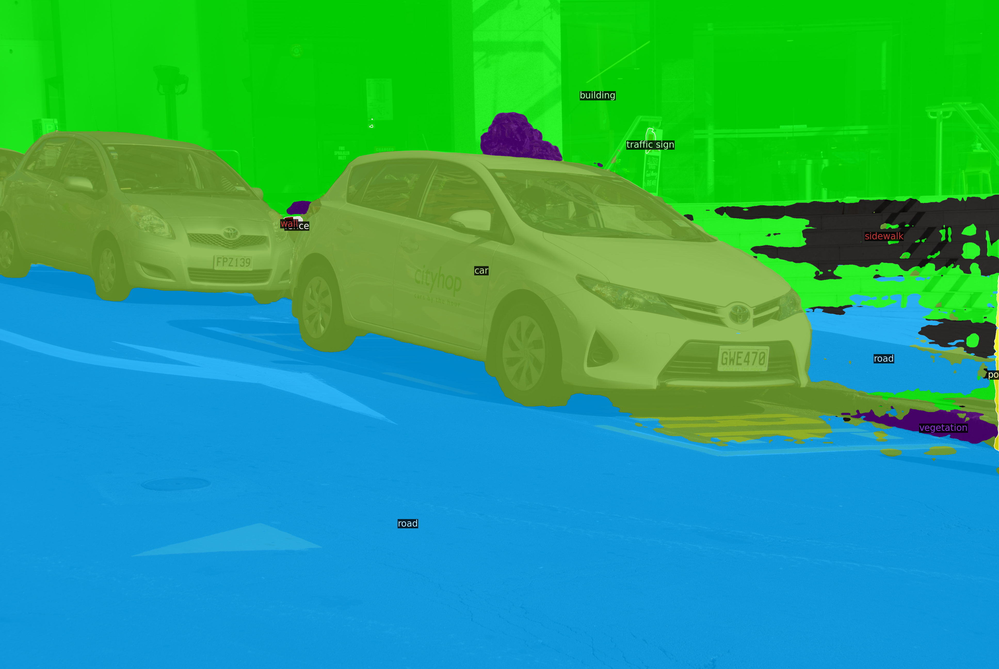

In [30]:
make_inference_visualize_outputs(deeplab_predictor, image_1, cityspace_metadata)

In [1]:
# make_inference_visualize_outputs(pointrend_predictor, image_1, cityspace_metadata)

In [2]:
# make_inference_visualize_outputs(deeplab_predictor, image_2, cityspace_metadata)

In [4]:
# make_inference_visualize_outputs(pointrend_predictor, image_2, cityspace_metadata)

In [3]:
# make_inference_visualize_outputs(deeplab_predictor, image_3, cityspace_metadata)

In [1]:
# make_inference_visualize_outputs(pointrend_predictor, image_3, cityspace_metadata)

Both DeepLab and PointRend were trained on [CitySpaces](https://www.cityscapes-dataset.com) with ImageNet pre-training. It's perhaps the reason why both models do well when given city images, but poorly in images from outside the city. I tried to use different images and the results were not amazing!

<a name='4'></a>

## 4. Final Notes

In this notebook, we have been performing semantic segmentation inference with DeepLabV3+ and PointRend.

The results are not perfect but they are still amazing given that we are using models that were trained on many stuffs. If you want to get better results, pick a dataset that you are interested in and do a custom training. It will take time but it will be worth it.

<a name='5'></a>

## 5. References and Further Learning

* [PointRend Colab Tutorial](https://colab.research.google.com/drive/1isGPL5h5_cKoPPhVL9XhMokRtHDvmMVL)
* [Encoder-Decoder with Atrous Separable Convolution for Semantic Image Segmentation](https://arxiv.org/abs/1802.02611)

* [PointRend: Image Segmentation as Rendering](https://arxiv.org/abs/1912.08193)
* [Detectron2 Projects](https://github.com/facebookresearch/detectron2/tree/main/projects)
